In [1]:
!pip install copick git+https://github.com/copick/copick-utils.git git+https://github.com/copick/DeepFindET.git

  Cloning https://github.com/copick/copick-utils.git to /tmp/pip-req-build-62tye7c0
  Running command git clone --filter=blob:none --quiet https://github.com/copick/copick-utils.git /tmp/pip-req-build-62tye7c0
  Resolved https://github.com/copick/copick-utils.git to commit d72192abb2d18dcd0ff8caa749f2327cf24ce894
  Installing build dependencies ... - \ | / - \ done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/copick/DeepFindET.git to /tmp/pip-req-build-tx_56d7d
  Running command git clone --filter=blob:none --quiet https://github.com/copick/DeepFindET.git /tmp/pip-req-build-tx_56d7d
  Resolved https://github.com/copick/DeepFindET.git to commit 15cef0e7a6000ea73df440042a8999812992e57d
  Installing build dependencies ... - \ | / - \ | done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.

In [2]:
# config file

config_blob = """{

  "name": "czii_cryoet_mlchallenge_2024",

  "description": "2024 CZII CryoET ML Challenge training data.",

  "version": "1.0.0",



  "pickable_objects":[

    {

            "name": "apo-ferritin",

            "is_particle": true,

            "pdb_id": "4V1W",

            "label": 1,

            "color": [  0, 117, 220, 128],

            "radius": 60,

            "map_threshold": 0.0418

        },

        {

            "name": "beta-amylase",

            "is_particle": true,

            "pdb_id": "1FA2",

            "label": 2,

            "color": [153,  63,   0, 128],

            "radius": 65,

            "map_threshold": 0.035

        },

        {

            "name": "beta-galactosidase",

            "is_particle": true,

            "pdb_id": "6X1Q",

            "label": 3,

            "color": [ 76,   0,  92, 128],

            "radius": 90,

            "map_threshold": 0.0578

        },

        {

            "name": "ribosome",

            "is_particle": true,

            "pdb_id": "6EK0",

            "label": 4,

            "color": [  0,  92,  49, 128],

            "radius": 150,

            "map_threshold": 0.0374

        },

        {

            "name": "thyroglobulin",

            "is_particle": true,

            "pdb_id": "6SCJ",

            "label": 5,

            "color": [ 43, 206,  72, 128],

            "radius": 130,

            "map_threshold": 0.0278

        },

        {

            "name": "virus-like-particle",

            "is_particle": true,

            "label": 6,

            "color": [255, 204, 153, 128],

            "radius": 135,

            "map_threshold": 0.201

        },

        {

            "name": "membrane",

            "is_particle": false,

            "label": 8,

            "color": [100, 100, 100, 128]

        },

        {

            "name": "background",

            "is_particle": false,

            "label": 9,

            "color": [10, 150, 200, 128]

        }

  ],



  "overlay_root": "/kaggle/working//output/overlay",



  "overlay_fs_args":{

    "auto_mkdir": true

  },



  "static_root":"/kaggle/input/czii-cryo-et-object-identification/train/static"

}"""



copick_config_path = "/kaggle/working/copick.config"

output_overlay = "/kaggle/working//output/overlay"



with open(copick_config_path, "w") as f:

  f.write(config_blob)


In [3]:
import os

import shutil



# set up new overlay directory



# define source and destination derectories

source_dir = "/kaggle/input/czii-cryo-et-object-identification/train/overlay"

destination_dir = output_overlay



# walk through the source directory

for root, dirs, files in os.walk(source_dir):

  # create corresponding subdir n the destination

  relative_path = os.path.relpath(root, source_dir)

  target_dir = os.path.join(destination_dir, relative_path)

  os.makedirs(target_dir, exist_ok=True)



  # copy and rename each file

  for file in files:

    if file.startswith("curation_0_"):

      new_filename = file

    else:

      new_filename = f"curation_0_{file}"



    # define full path for the source and destination files

    source_file = os.path.join(root, file)

    destination_file = os.path.join(target_dir, new_filename)



    # copy the file with the new name

    shutil.copy2(source_file, destination_file)

    print(f"Copied {source_file} to {destination_file}")


Copied /kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_86_3/Picks/beta-amylase.json to /kaggle/working//output/overlay/ExperimentRuns/TS_86_3/Picks/curation_0_beta-amylase.json
Copied /kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_86_3/Picks/beta-galactosidase.json to /kaggle/working//output/overlay/ExperimentRuns/TS_86_3/Picks/curation_0_beta-galactosidase.json
Copied /kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_86_3/Picks/apo-ferritin.json to /kaggle/working//output/overlay/ExperimentRuns/TS_86_3/Picks/curation_0_apo-ferritin.json
Copied /kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_86_3/Picks/virus-like-particle.json to /kaggle/working//output/overlay/ExperimentRuns/TS_86_3/Picks/curation_0_virus-like-particle.json
Copied /kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_86_3/Picks/ribosome.json to /kaggle/working//o

## Step 1. Data prep: labeling and annotation

Build target from tomograms for training


In [4]:
from deepfindET.entry_points import step1

from deepfindET.utils import copick_tools

import matplotlib.pyplot as plt

import copick



%matplotlib inline



############ Input Parameters ################



# config file

config = copick_config_path



# Query Tomogram

voxel_size = 10

tomogram_algorithm = 'denoised' # The reconstruction algorithm used for the tomogram



# Output name for the Segmentation Targets

out_name = 'remotetargets'

out_user_id = 'deepfindET'

out_session_id = '1'



# Read Copick Directory

copickRoot = copick.from_file(config)



# Query Train Protein coordinates and any Associated Segmentations\

train_targets = {}



# Define protein targets with their respective radii

# there are two forms of inputs:

# ('protein-name', radius) or

# ('protein-name', 'user-id', 'session-id', 'radius')



targets = [

    (obj.name, None, None, (obj.radius/voxel_size))

    for obj in copickRoot.pickable_objects if obj.is_particle

]



# targets = [

#     ('adp-mitochondrial', None, None, 7.5),

#     ('alkaline-phosphate', None, None, 7.5),

#     ('nucleosome', None, None, 6.5),

#     ('ribosome', None, None, 11),

#     ('vault', None, None, 13),

#     ('virus-like-capsid', None, None, 11)

# ]



# Set run_ids to None, indicating that targets will be generated for the entire CoPick project by default.

# If specific Run-IDs were provided, this variable would contain a list of those IDs.

run_ids = None


Generate the targets for the model through a function, the other way is via CLI.

In [5]:
# Generate train target information

for t in targets:

  obj_name, user_id, session_id, radius = t

  info = {

      "label": copickRoot.get_object(obj_name).label,

      "user_id": user_id,

      "session_id": session_id,

      "radius": radius,

      "is_particle_target": True,

  }

  train_targets[obj_name] = info



# Define segmentation target (e.g., membrane)

seg_targets = [('membrane', None, None)]



# Generate segmentation target information

for s in seg_targets:

  obj_name, user_id, session_id = s

  info = {

      "label": copickRoot.get_object(obj_name).label,

      "user_id": user_id,

      "session_id": session_id,

      "radius": None,

      "is_particle_target": False,

  }

  train_targets[obj_name] = info



# Call the create_train_targets function from step1 to generate the traingin targets for the 3D u-net model

# The funtion will use the parameters defined in the previous cells and following inputs

step1.create_train_targets(

    config,

    train_targets,

    run_ids,

    voxel_size,

    tomogram_algorithm,

    out_name,

    out_user_id,

    out_session_id,

)


Processing Run: TS_5_4
Annotating 140 objects ...

Processing Run: TS_69_2
Annotating 143 objects ...

Processing Run: TS_6_4
Annotating 193 objects ...

Processing Run: TS_6_6
Annotating 143 objects ...

Processing Run: TS_73_6
Annotating 217 objects ...

Processing Run: TS_86_3
Annotating 225 objects ...

Processing Run: TS_99_9
Annotating 208 objects ...



Visualize the Tomogram and Target Volumes

In [6]:
run_ids

In [7]:
# Option 1 : query all RunIDs

# Retrieve all availabe Run-IDs from the CoPick project,

# This generates a list of Run-IDs by iterating over all runs in copickRoot.

run_ids = [run.name for run in copickRoot.runs]



# Option 2 : Manually specify specific run

# Define a specific Run-ID manually.

# This is useful for extracting volumes for a specific run.

runID = 'TS_5_4'



# Retrieve the specific run object from CoPick using the manually specified Run-ID

copick_run = copickRoot.get_run(runID)



# Extract the segmentation target associated with the specific run.

# The function get_copick_segmmentation retrieves the segmentation data (e.g., target volume)

# based on the run object, segmentation name, user ID, and session ID

train_targets = copick_tools.get_copick_segmentation(

    copick_run,

    segmentationName = 'remotetargets',

    userID = 'deepfindET',

    sessionID = '1'

)



# Retrieve the tomogram associated with the specific Run-ID from the copick project

# The function get_copick_topogram extracts the tomogram data, using the voxel size, algorithm and Run ID

train_tomogram = copick_tools.get_copick_tomogram(

    copickRoot,

    voxelSize = voxel_size,

    # tomoAlgorithm = 'wbp'   #'wbp' (weighted back projection).

    tomoAlgorithm='denoised',    # The reconstruction algorithm used for the tomogram

    tomoID = runID

)

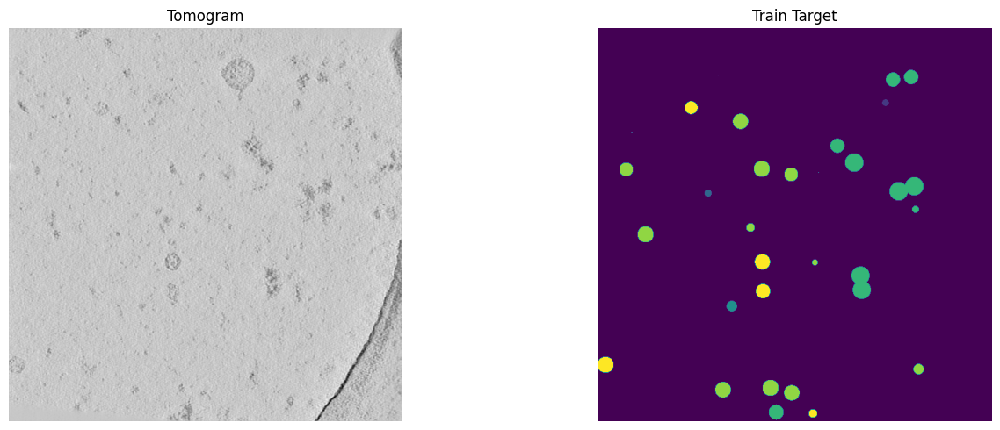

In [8]:
plt.figure(figsize = (15, 5))



# Original image

plt.subplot(1,2,1)

plt.title('Tomogram')

plt.imshow(train_tomogram[90,], cmap='gray')

plt.axis('off')



plt.subplot(1,2,2)

plt.title('Train Target')

plt.imshow(train_targets[90,])

plt.axis('off')



plt.tight_layout()

plt.show()


## Step 2. Training DeepFindET 3D CNN model

In [9]:
from deepfindET.entry_points import step2



# specify dir where the training results will be saved

training_output_path = '/kaggle/working/output/training'



# which combines U-net with residual connections to improve training

model_name = 'res_unet'  # framework is TensorFlow



# model betrained from scratch without using pre-trained weights

model_pre_weights = None



# Number of classes to predict with the model

# 8 classes = 6 proteins + membrane + background

n_class = 8



# Input dimension size of the 3D volumns in voxels,

# each input is 72x72x72 voxel cube -- (72 Å)^3.

dim_in = 72 # [voxels]

**Launch model training**


Training res_unet with Randomly Initialized Weights

Physical devices cannot be modified after being initialized
Loading Targets and Tomograms for the Following Runs: ['TS_73_6', 'TS_99_9', 'TS_6_4', 'TS_6_6']


100%|██████████| 4/4 [00:07<00:00,  1.96s/it]


Loading Targets and Tomograms for the Following Runs: ['TS_5_4', 'TS_69_2']


100%|██████████| 2/2 [00:02<00:00,  1.27s/it]


Configuration saved to /kaggle/working/output/training/experiment_config.json

Training Parameters:  {
    "input": {
        "config_path_train": "/kaggle/working/copick.config",
        "config_path_valid": null,
        "target_name": "remotetargets",
        "target_user_id": "deepfindET",
        "target_session_id": "1"
    },
    "output": {
        "out_dir": "/kaggle/working/output/training",
        "classes": {
            "apo-ferritin": 1,
            "beta-amylase": 2,
            "beta-galactosidase": 3,
            "ribosome": 4,
            "thyroglobulin": 5,
            "virus-like-particle": 6,
            "membrane": 8,
            "background": 9
        }
    },
    "network_architecture": {
        "architecture": "res_unet",
        "layers": [
            48,
            64,
            128
        ],
        "dropout_rate": 0.0
    },
    "training_params": {
        "n_class": 8,
        "dim_in": 72,
        "batch_size": 15,
        "epochs": 30,
        "

I0000 00:00:1734350318.156689     185 service.cc:145] XLA service 0x78b6b40f68a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734350318.156753     185 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-12-16 11:58:44.401674: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=4,k3=0} for conv (f16[15,48,72,72,72]{4,3,2,1,0}, u8[0]{0}) custom-call(f16[15,48,72,72,72]{4,3,2,1,0}, f16[48,48,3,3,3]{4,3,2,1,0}, f16[48]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-12-16 11:58:44.521180: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation to

150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6014 - loss: 2936.0776

2024-12-16 12:14:46.261669: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=4,k3=0} for conv (f16[32,48,72,72,72]{4,3,2,1,0}, u8[0]{0}) custom-call(f16[32,48,72,72,72]{4,3,2,1,0}, f16[48,48,3,3,3]{4,3,2,1,0}, f16[48]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-12-16 12:14:47.647748: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.386199649s
Trying algorithm eng11{k2=4,k3=0} for conv (f16[32,48,72,72,72]{4,3,2,1,0}, u8[0]{0}) custom-call(f16[32,48,72,72,72]{4,3,2,1,0}, f16[48,48,3,3,3]{4,3,2,1,0}, f16[48]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActiv

4/5 ━━━━━━━━━━━━━━━━━━━━ 6s 7s/step 

2024-12-16 12:15:57.107899: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=4,k3=0} for conv (f16[22,48,72,72,72]{4,3,2,1,0}, u8[0]{0}) custom-call(f16[22,48,72,72,72]{4,3,2,1,0}, f16[48,48,3,3,3]{4,3,2,1,0}, f16[48]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-12-16 12:15:57.748084: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.640286266s
Trying algorithm eng11{k2=4,k3=0} for conv (f16[22,48,72,72,72]{4,3,2,1,0}, u8[0]{0}) custom-call(f16[22,48,72,72,72]{4,3,2,1,0}, f16[48,48,3,3,3]{4,3,2,1,0}, f16[48]{0}), window={size=3x3x3 pad=1_1x1_1x1_1}, dim_labels=bf012_oi012->bf012, custom_call_target="__cudnn$convBiasActiv

5/5 ━━━━━━━━━━━━━━━━━━━━ 103s 14s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 1152s 7s/step - accuracy: 0.6027 - loss: 2933.9607 - val_accuracy: 0.7451 - val_loss: 6.9055 - learning_rate: 1.0000e-04
Epoch 2/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9331 - loss: 2025.1150 - val_accuracy: 0.8885 - val_loss: 5.7811 - learning_rate: 1.0000e-04
Epoch 3/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 952s 6s/step - accuracy: 0.9442 - loss: 1797.2639 - val_accuracy: 0.9578 - val_loss: 4.7170 - learning_rate: 1.0000e-04
Epoch 4/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 952s 6s/step - accuracy: 0.9500 - loss: 1596.5997 - val_accuracy: 0.9539 - val_loss: 4.2059 - learning_rate: 1.0000e-04
Epoch 5/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 952s 6s/step - accuracy: 0.9556 - loss: 1503.6255 - val_accuracy: 0.9709 - val_loss: 4.6730 - learning_rate: 1.0000e-04
Epoch 6/30
5/5 ━━━━━━━━

100%|██████████| 4/4 [00:02<00:00,  1.52it/s]


Loading Targets and Tomograms for the Following Runs: ['TS_5_4', 'TS_69_2']


100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

150/150 ━━━━━━━━━━━━━━━━━━━━ 955s 6s/step - accuracy: 0.9650 - loss: 1108.8655 - val_accuracy: 0.9729 - val_loss: 3.9887 - learning_rate: 1.0000e-04
Epoch 11/30


5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 952s 6s/step - accuracy: 0.9652 - loss: 1191.1304 - val_accuracy: 0.9650 - val_loss: 4.0434 - learning_rate: 1.0000e-04
Epoch 12/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9689 - loss: 1146.3036 - val_accuracy: 0.9684 - val_loss: 3.8378 - learning_rate: 1.0000e-04
Epoch 13/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 952s 6s/step - accuracy: 0.9681 - loss: 1074.3928 - val_accuracy: 0.9509 - val_loss: 3.7092 - learning_rate: 1.0000e-04
Epoch 14/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9692 - loss: 1055.4406 - val_accuracy: 0.9694 - val_loss: 3.8715 - learning_rate: 1.0000e-04
Epoch 15/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 950s 6s/step - accuracy: 0.9685 - loss: 1148.1609 - val_accuracy: 0.9621 - val_loss: 3.9817 - learning_rate: 1.0000e-04
Epoch 16/30
5/5 ━━━━━━

100%|██████████| 4/4 [00:02<00:00,  1.59it/s]


Loading Targets and Tomograms for the Following Runs: ['TS_5_4', 'TS_69_2']


100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

150/150 ━━━━━━━━━━━━━━━━━━━━ 955s 6s/step - accuracy: 0.9749 - loss: 985.2852 - val_accuracy: 0.9763 - val_loss: 3.7223 - learning_rate: 1.0000e-04
Epoch 21/30


5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 953s 6s/step - accuracy: 0.9752 - loss: 917.4696 - val_accuracy: 0.9713 - val_loss: 3.6814 - learning_rate: 1.0000e-04
Epoch 22/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 950s 6s/step - accuracy: 0.9744 - loss: 949.0776 - val_accuracy: 0.9714 - val_loss: 3.8389 - learning_rate: 1.0000e-04
Epoch 23/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9757 - loss: 919.1213 - val_accuracy: 0.9715 - val_loss: 4.0289 - learning_rate: 1.0000e-04
Epoch 24/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9744 - loss: 944.4356 - val_accuracy: 0.9489 - val_loss: 3.8747 - learning_rate: 1.0000e-04
Epoch 25/30
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step
150/150 ━━━━━━━━━━━━━━━━━━━━ 951s 6s/step - accuracy: 0.9744 - loss: 1061.6759 - val_accuracy: 0.9754 - val_loss: 4.4124 - learning_rate: 1.0000e-04
Epoch 26/30
5/5 ━━━━━━━━━━

100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


Loading Targets and Tomograms for the Following Runs: ['TS_5_4', 'TS_69_2']


100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

150/150 ━━━━━━━━━━━━━━━━━━━━ 955s 6s/step - accuracy: 0.9780 - loss: 919.9651 - val_accuracy: 0.9746 - val_loss: 4.0589 - learning_rate: 1.0000e-04


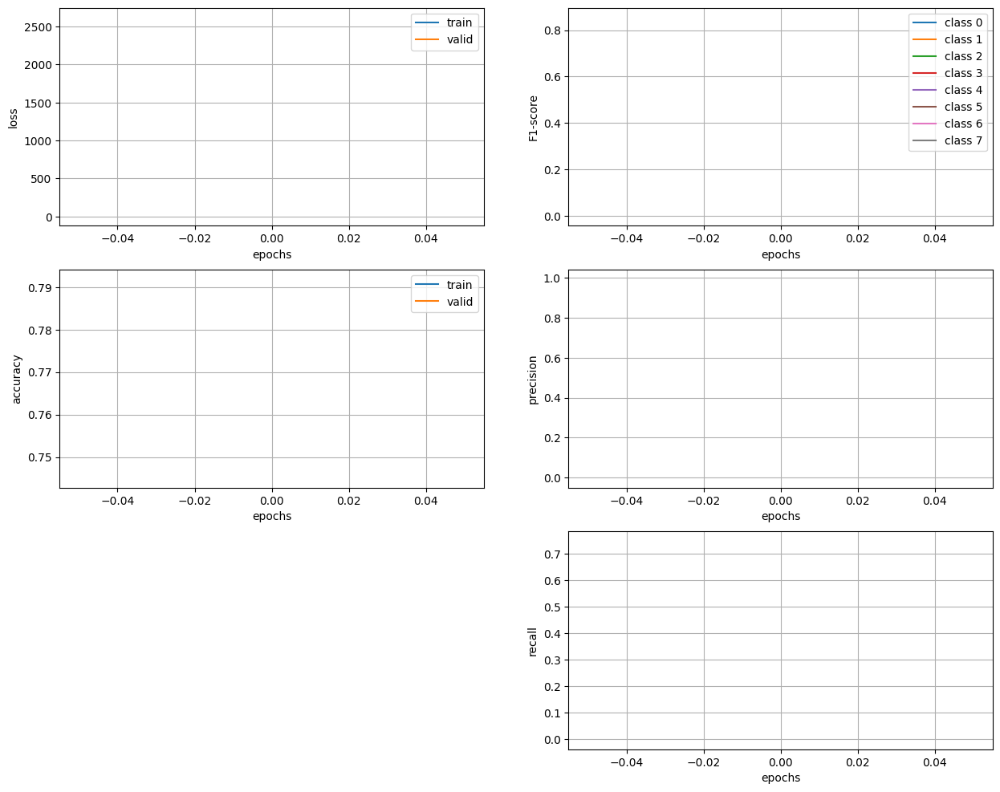

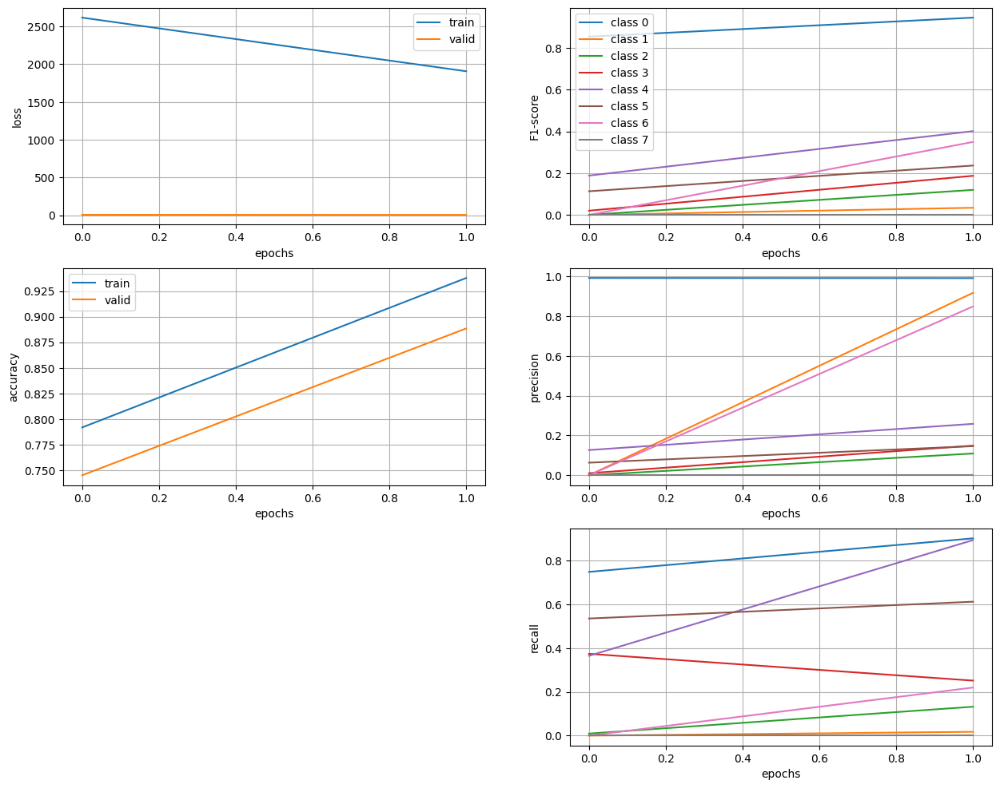

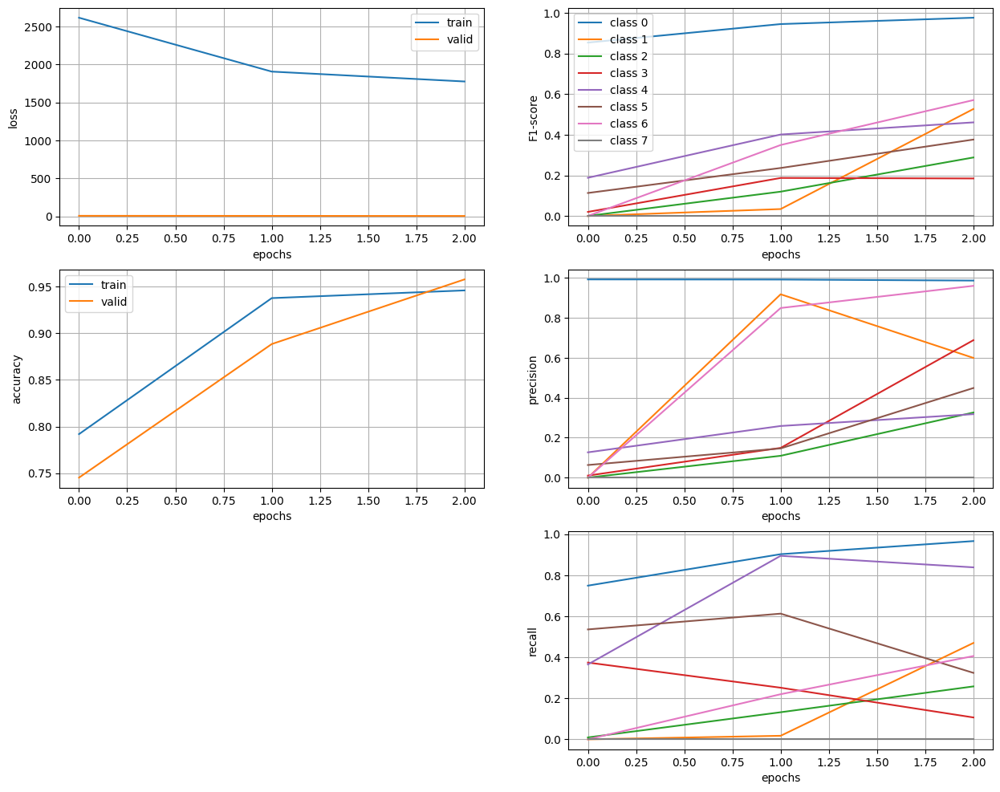

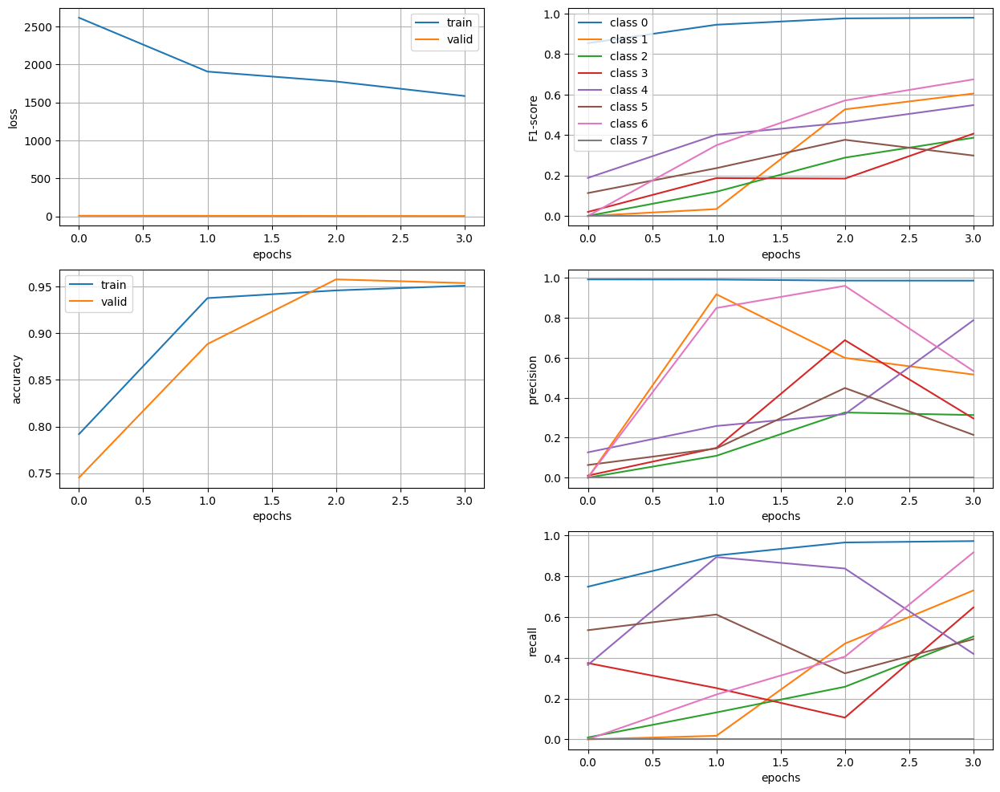

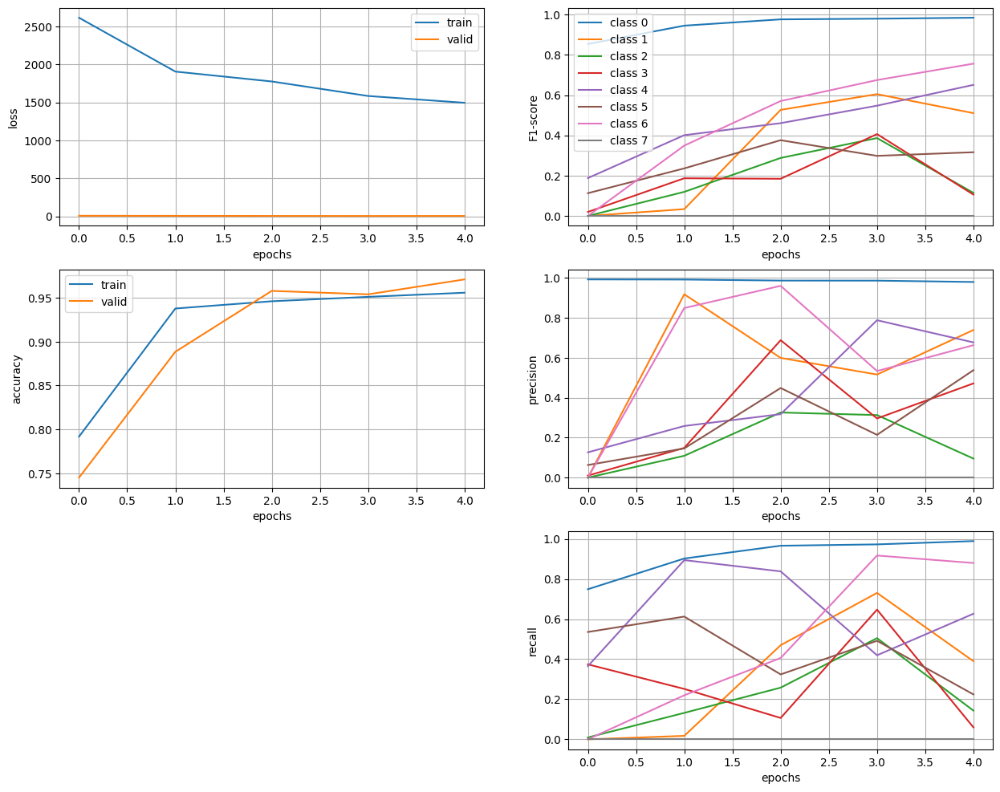

...

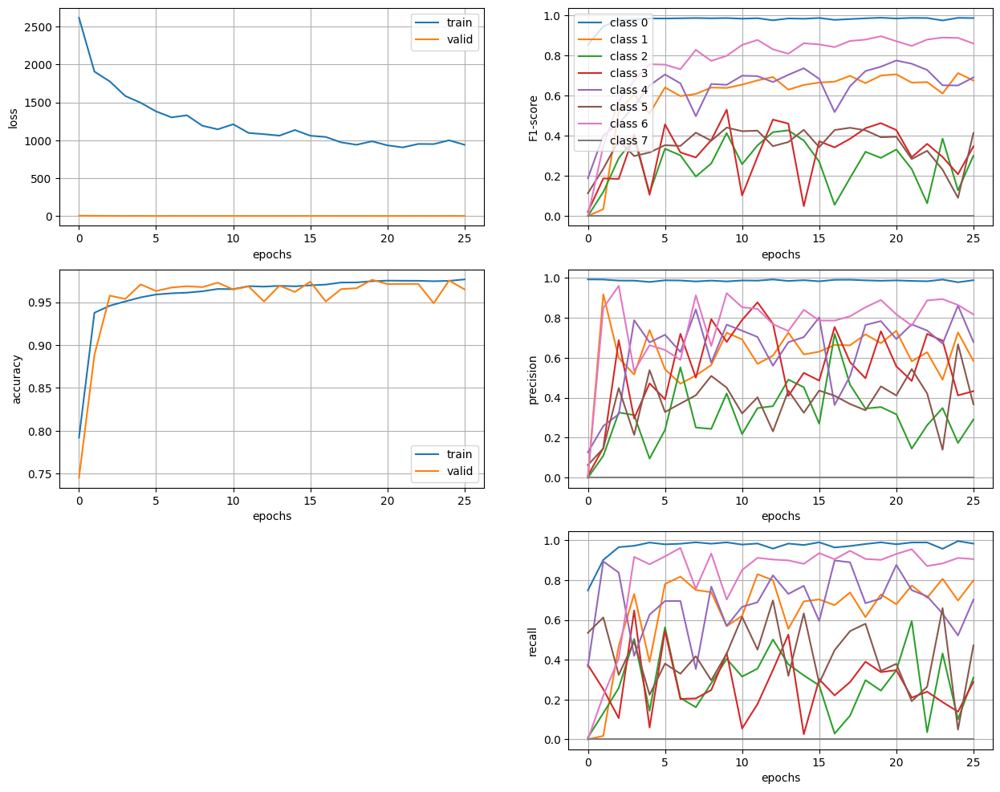

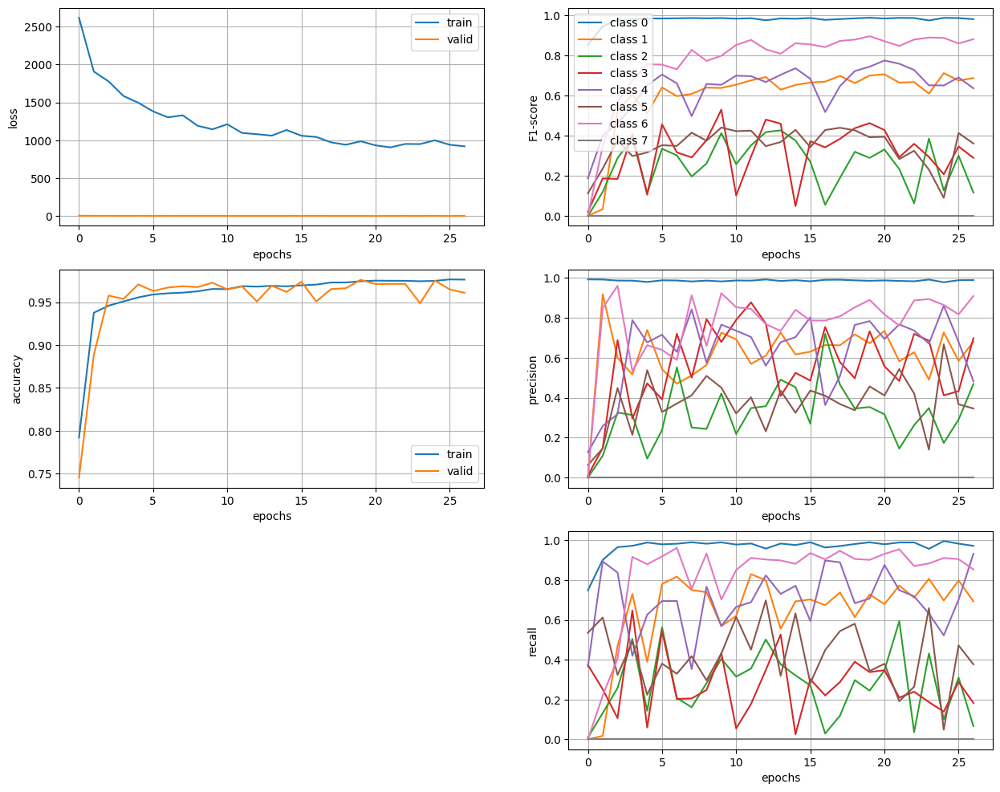

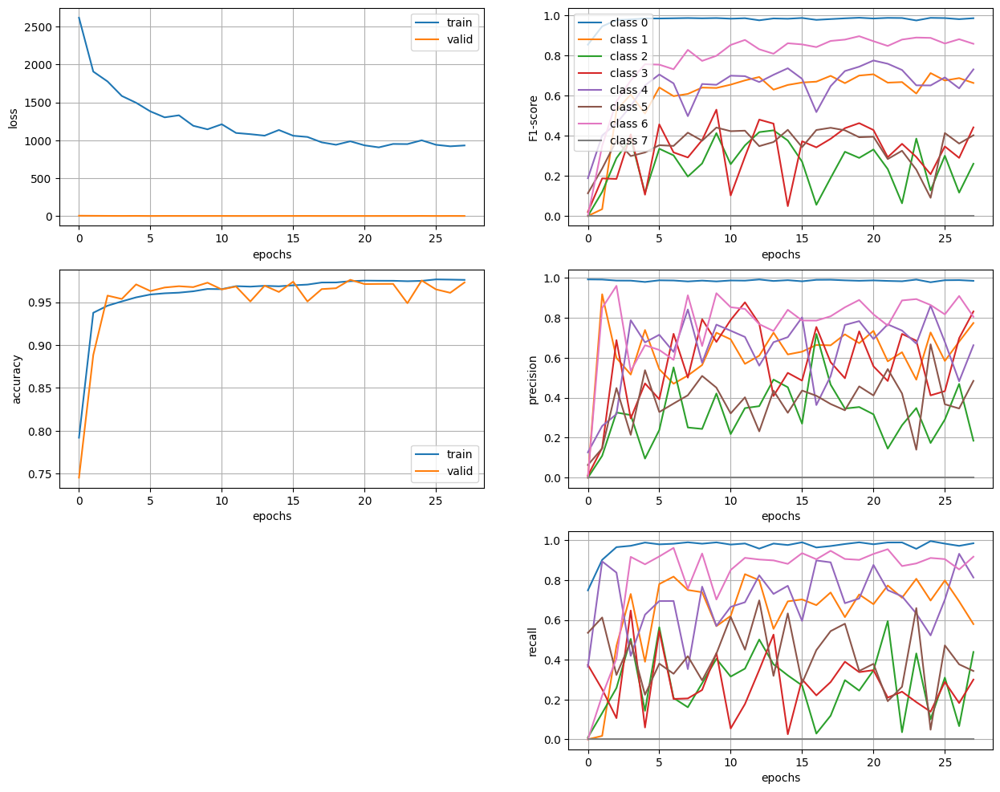

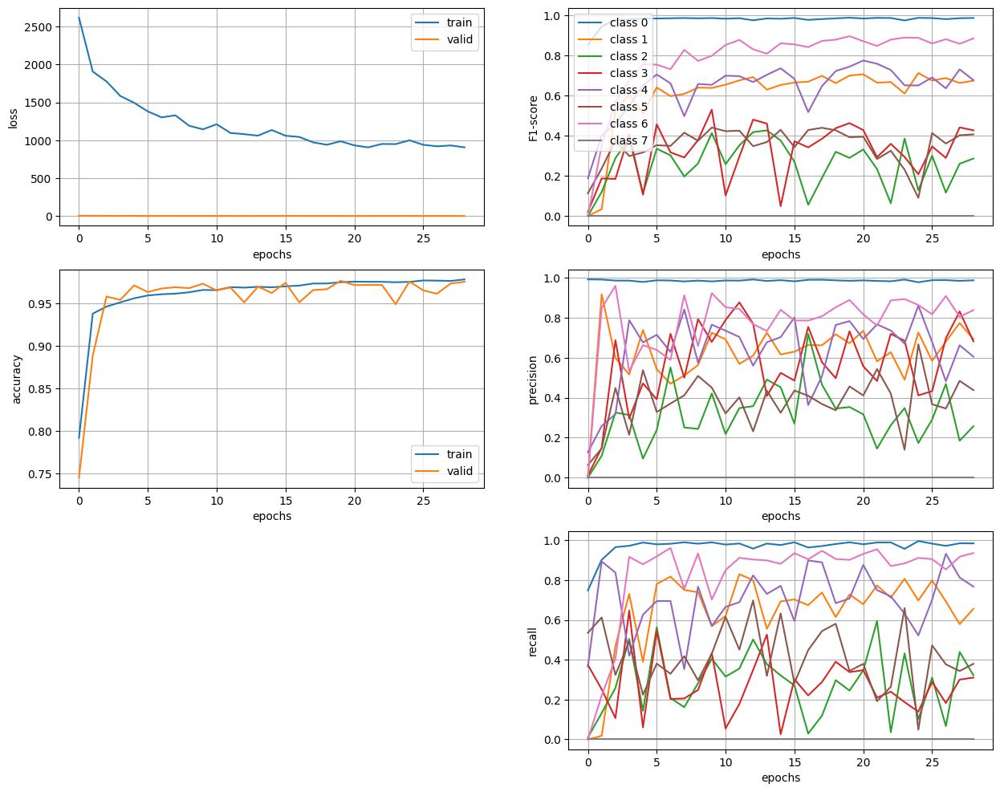

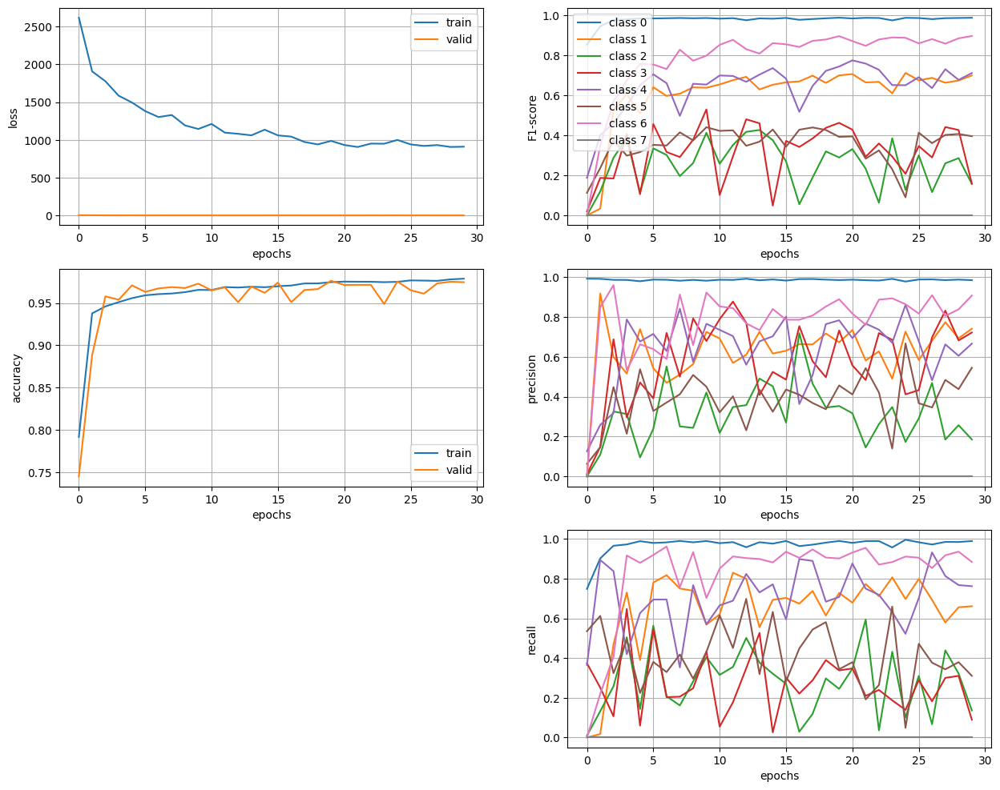

In [10]:
# Initiate the training of DeepFindET 3D U-Net model.

# The training parameters will automatically be saved in the training_output_path as experiment_config.json



step2.train_model(

    config,

    voxel_size,      # Determines the resolution of the 3D input data.

    tomogram_algorithm,

    targets,      # the ground truth segmentation labels used for training.

    training_output_path,

    model_name,   # The architecture of the neural network.

    model_pre_weights,

    n_class,

    path_valid=None,  # Path to validation data (None means internal splitting may be used).

    dim_in = dim_in, # Input dimension size in voxels.

    n_sub_epoch = 10, # Number of epochs per tomogram.

    sample_size = 4,

    batch_size = 15,

    epochs = 30,

    steps_per_epoch = 150,

    n_valid = 20,

    model_filters = [48, 64, 128], # Number of filters in each convolutional layer.

    model_dropout = 0, # Dropout rate for regularization.

    target_name = "remotetargets",

    target_user_id = "deepfindET",

    target_session_id = "1",

    valid_tomo_ids = None,

    train_tomo_ids = None,

    class_weights = (('apo-ferritin', 62400), ('beta-amylase', 4130),

                    ('beta-galactosidase', 3080), ('ribosome', 1800),

                    ('thyroglobulin', 10100), ('virus-like-particle', 8400))

)


i. Hyperparameters

params to fine tune:

*  batch size --- test training speed



for Overfitting

*  dropout --- regularization

*  Number of filter in each converlutional layers --- complexity

*  early stop



use GridSearch to find best params



2. Add traning data



add synthetic images to training data



data augmentation






